In [21]:
%load_ext nb_black
# https://medium.com/openplanetary/code-formatting-in-jupyter-cells-8fee4eda072f

The nb_black extension is already loaded. To reload it, use:
  %reload_ext nb_black


<IPython.core.display.Javascript object>

## Compare New Dataset to Old Dataset (test images)

In [22]:
import os
import pandas as pd
import numpy as np
import json
import mmcv
import itertools
import shutil
import matplotlib.pyplot as plt
import matplotlib.patches as patches

from collections import defaultdict
from PIL import Image
from IPython.display import display, HTML

from classes.WheatDataset import WheatDataset
from helpers import utils

%matplotlib inline

<IPython.core.display.Javascript object>

#### Define some paths

In [23]:
path_updated_json = "/home/badhon/Documents/thesis/Data and Scripts from AL/global-WHEAT-final/train/usas_minipam.json"
path_old_test_json = (
    "/home/badhon/Documents/thesis/AerialDetection/data/wheat/test/test_hbb.json"
)
path_images = "/home/badhon/Documents/thesis/Data and Scripts from AL/global-WHEAT-final/train/usas_minipam/"

<IPython.core.display.Javascript object>

#### Load Dataset

In [24]:
# Updated Dataset
dataset = WheatDataset(path_updated_json, path_images)
dataset.load_dataset()

# Old Test Dataset
test_dataset_old = WheatDataset(path_old_test_json, path_images)
test_dataset_old.load_dataset()

<IPython.core.display.Javascript object>

#### Print number of detections per image in both dataset

In [25]:
test_images = test_dataset_old.get_file_names()

df_stat = dataset.get_dataset_stat(test_images.tolist())
df_stat_old = test_dataset_old.get_dataset_stat()

df_merged = df_stat.merge(df_stat_old, on="filename")
df_merged["old - updated"] = df_merged["no_of_anno_x"] - df_merged["no_of_anno_y"]

display(df_merged)

print("Total Number of Detections: ")
print("Updated Dataset: ", df_merged["no_of_anno_x"].sum())
print("Updated Dataset: ", df_merged["no_of_anno_y"].sum())

,filename,no_of_anno_x,no_of_anno_y,old - updated
0,crop_1_crop_0_473-compressed.png,42,42,0
1,crop_1_crop_0_4745-compressed.png,19,19,0
2,crop_1_crop_0_4760-compressed.png,35,32,3
3,crop_1_crop_0_4855-compressed.png,32,32,0
4,crop_1_crop_0_4909-compressed.png,50,48,2
5,crop_1_crop_0_4955-compressed.png,33,32,1
6,crop_1_crop_0_521-compressed.png,21,22,-1
7,crop_1_crop_0_698-compressed.png,20,20,0
8,crop_1_crop_0_710-compressed.png,27,27,0
9,crop_1_crop_0_747-compressed.png,22,23,-1


Total Number of Detections: 
Updated Dataset:  585
Updated Dataset:  586


<IPython.core.display.Javascript object>

#### Display ground truth for both dataset (test images)

crop_1_crop_0_473-compressed.png
42 42


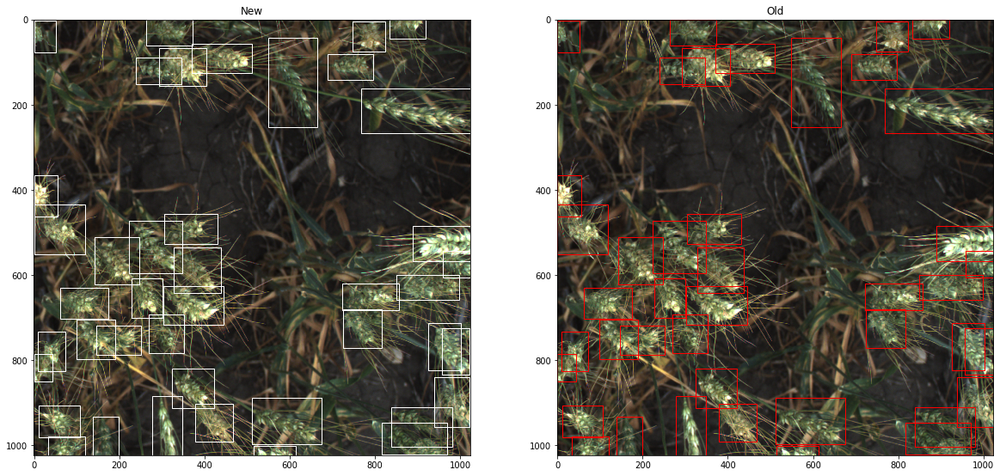

crop_1_crop_0_4745-compressed.png
19 19


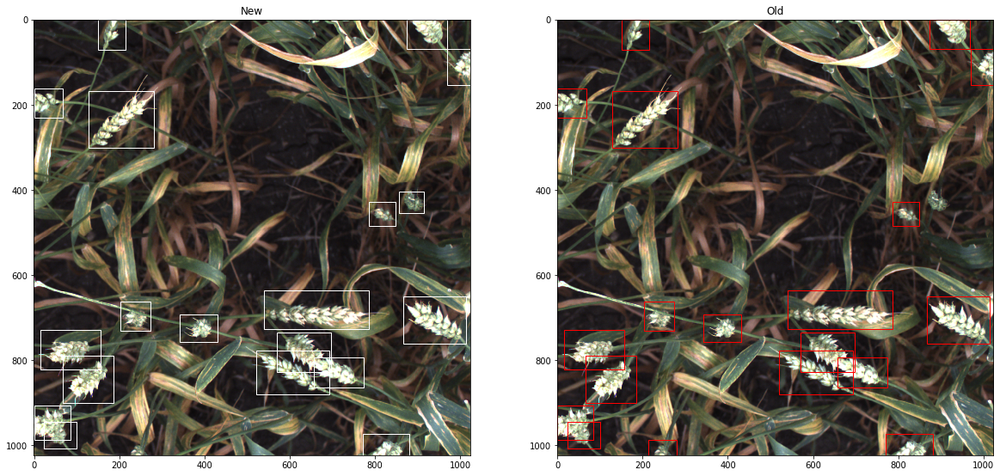

crop_1_crop_0_4760-compressed.png
35 32


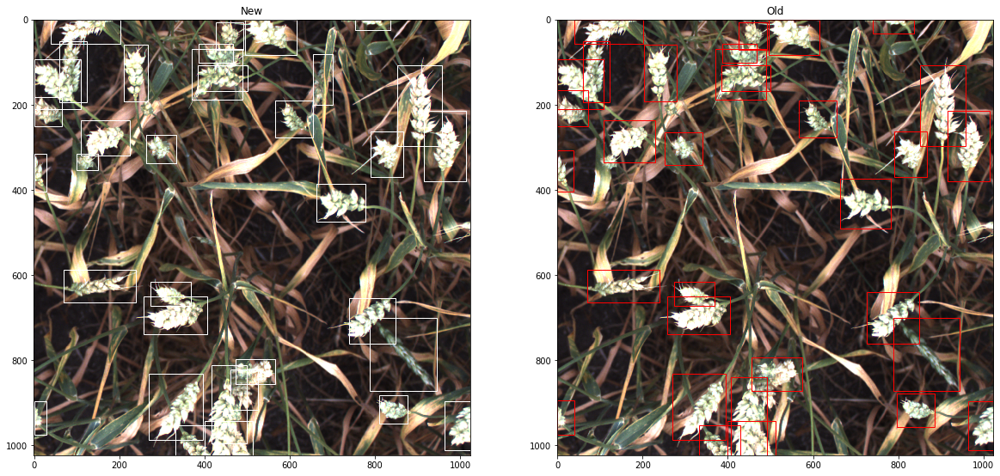

crop_1_crop_0_4855-compressed.png
32 32


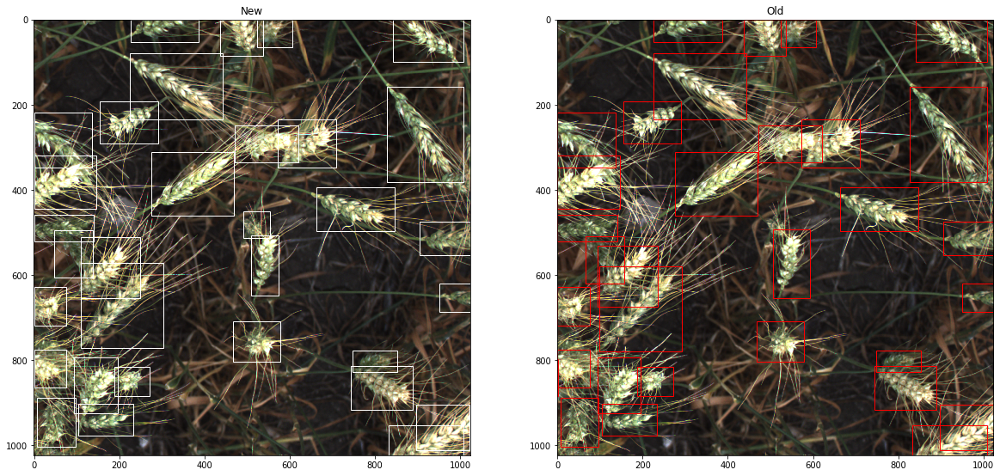

crop_1_crop_0_4909-compressed.png
50 48


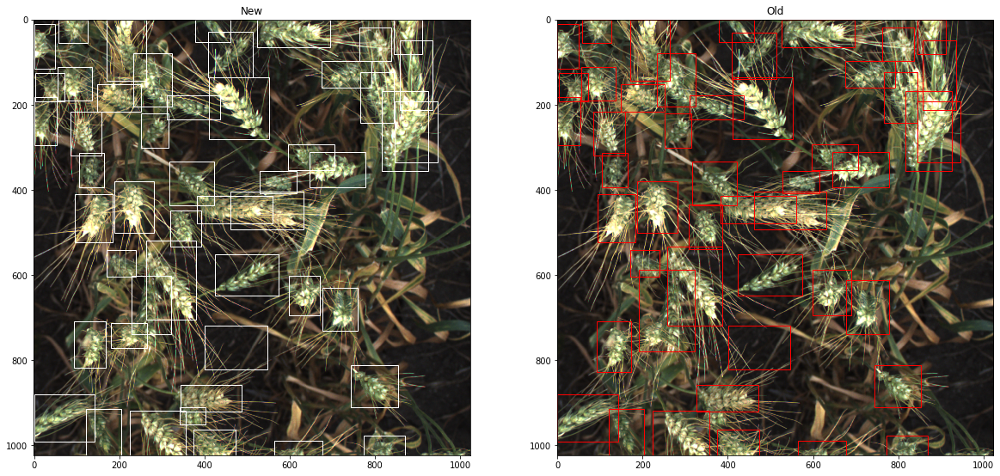

crop_1_crop_0_4955-compressed.png
33 32


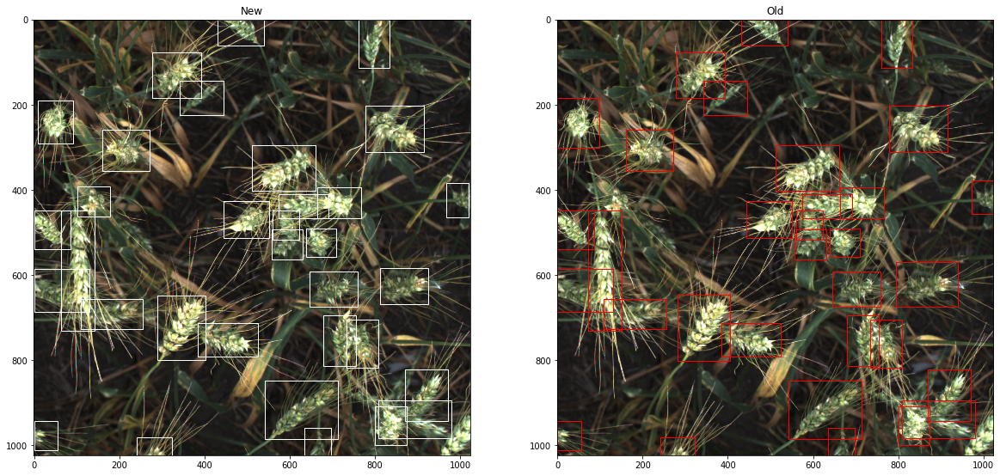

crop_1_crop_0_521-compressed.png
21 22


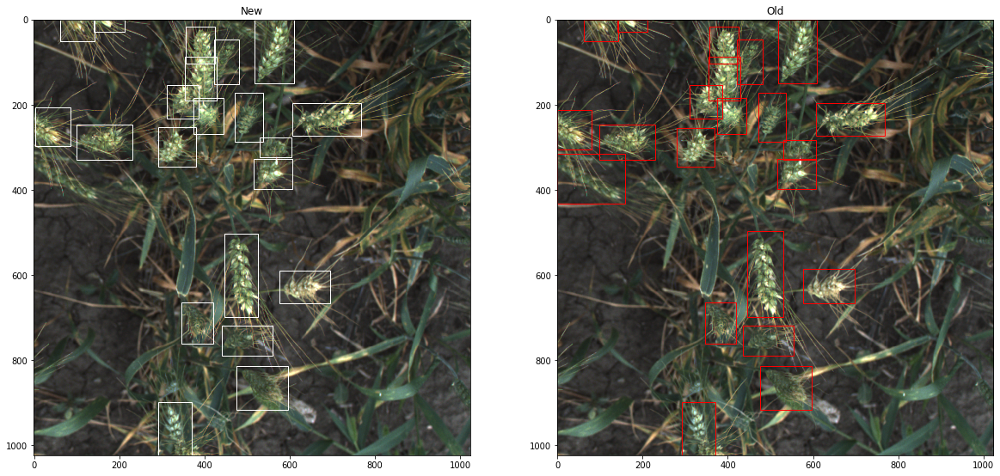

crop_1_crop_0_698-compressed.png
20 20


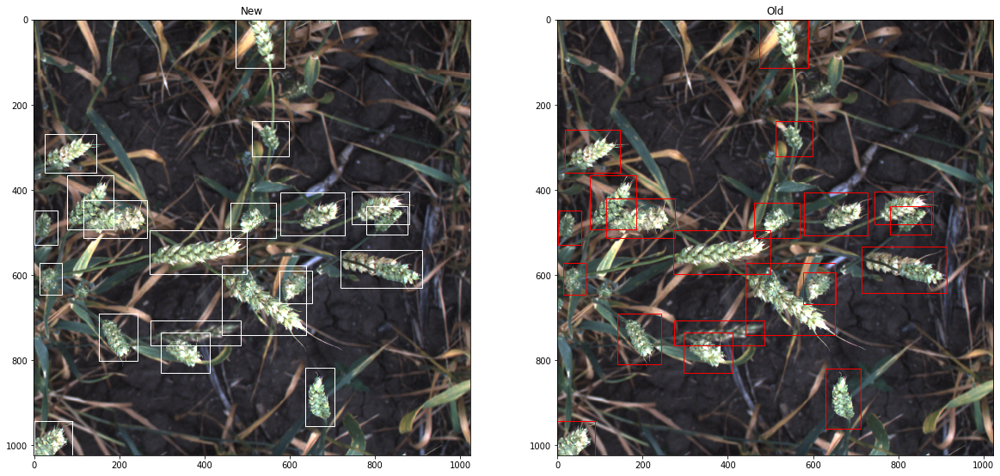

crop_1_crop_0_710-compressed.png
27 27


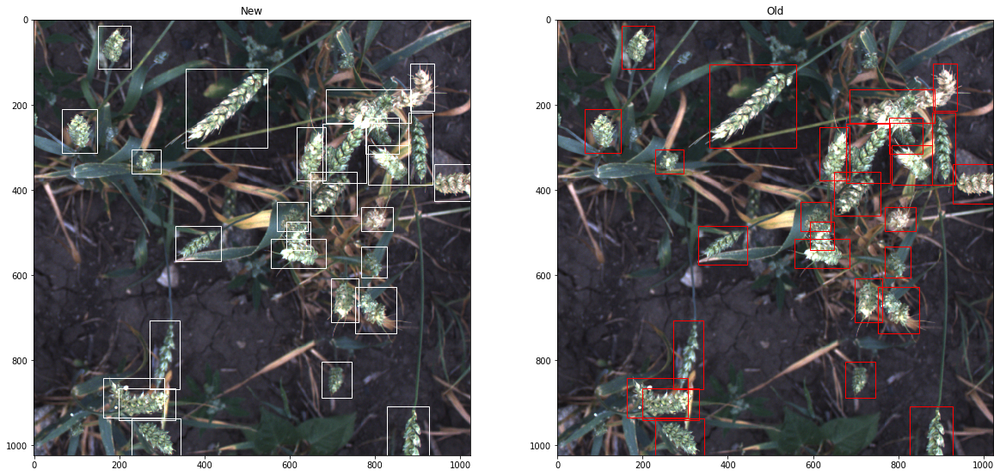

crop_1_crop_0_747-compressed.png
22 23


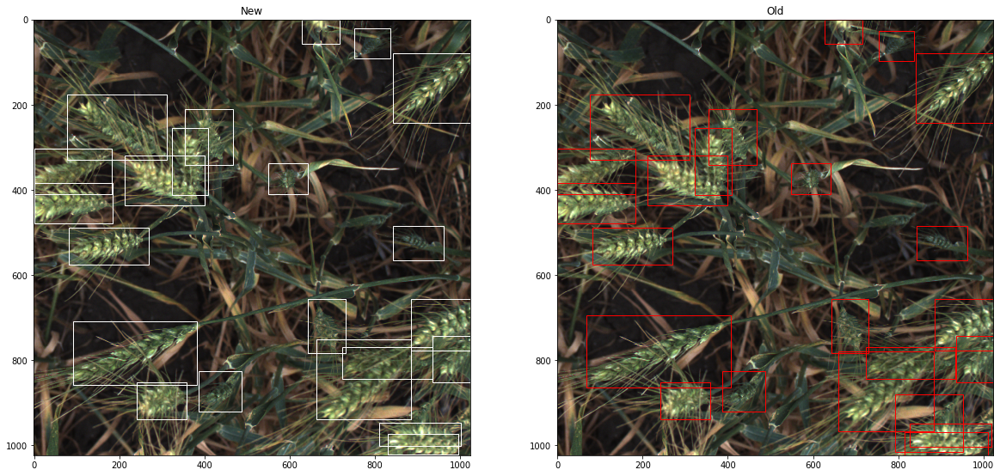

crop_1_crop_0_771-compressed.png
22 22


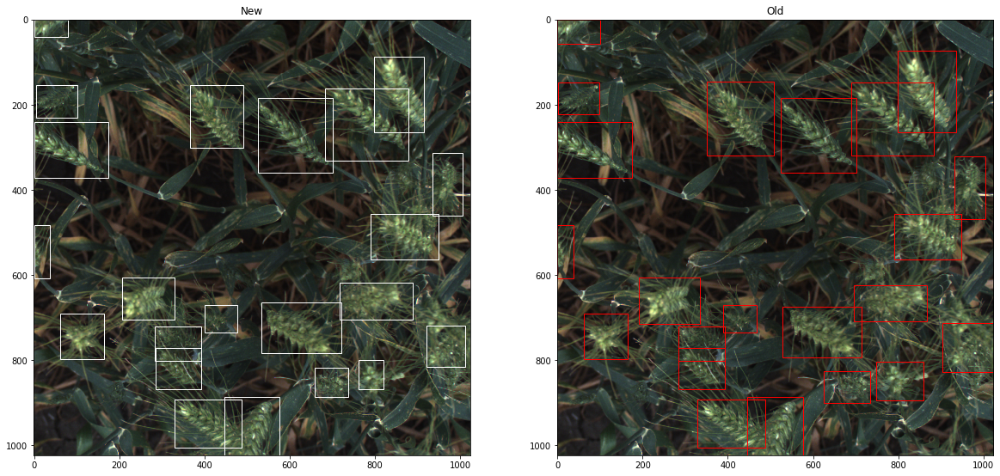

crop_1_crop_0_810-compressed.png
34 34


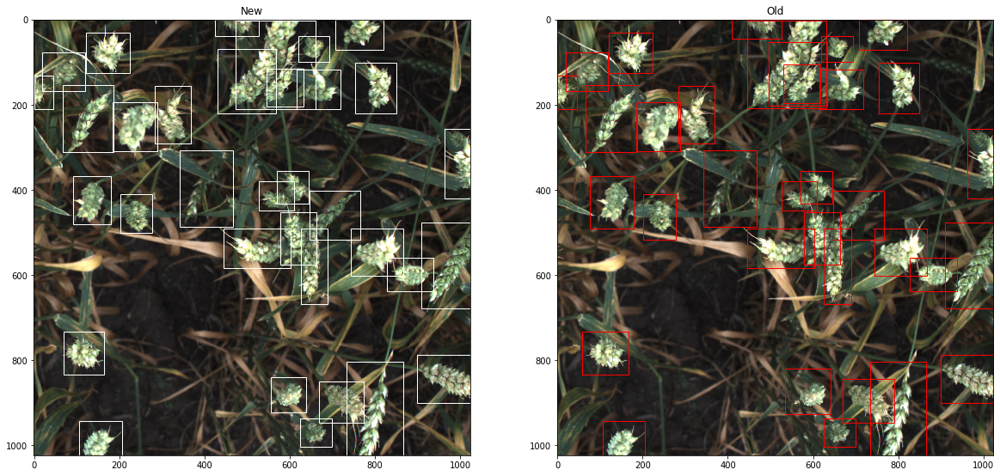

crop_1_crop_0_82-compressed.png
43 43


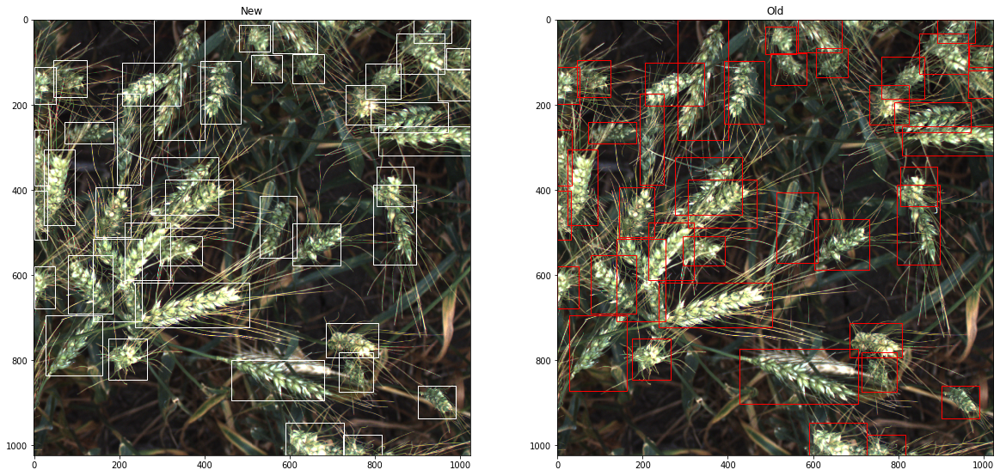

crop_1_crop_0_834-compressed.png
35 36


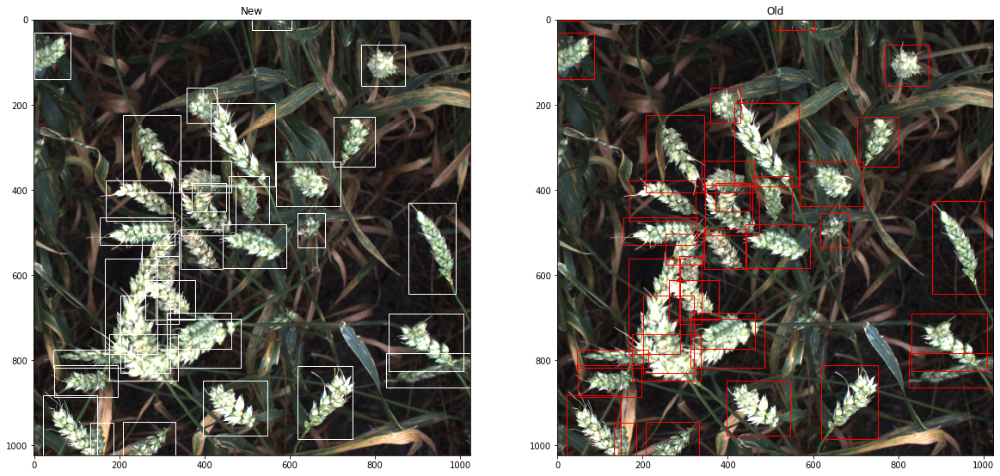

crop_1_crop_0_905-compressed.png
36 38


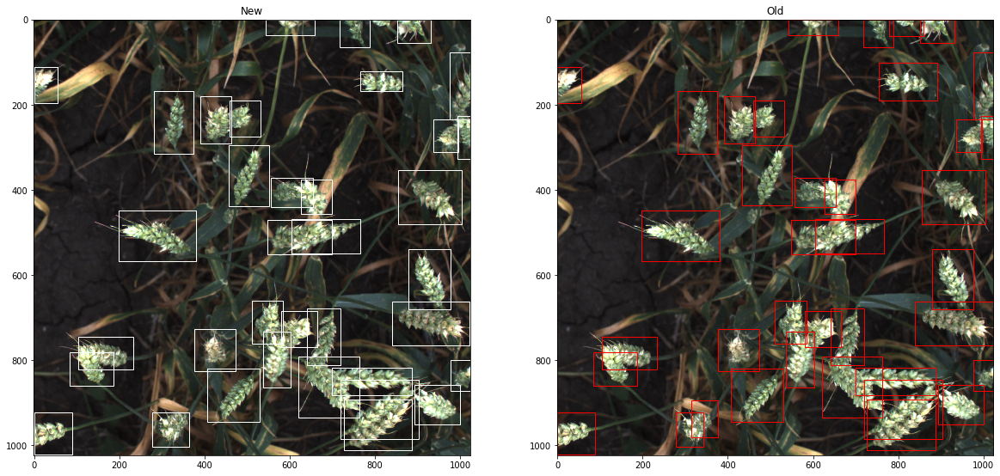

crop_1_crop_0_913-compressed.png
22 23


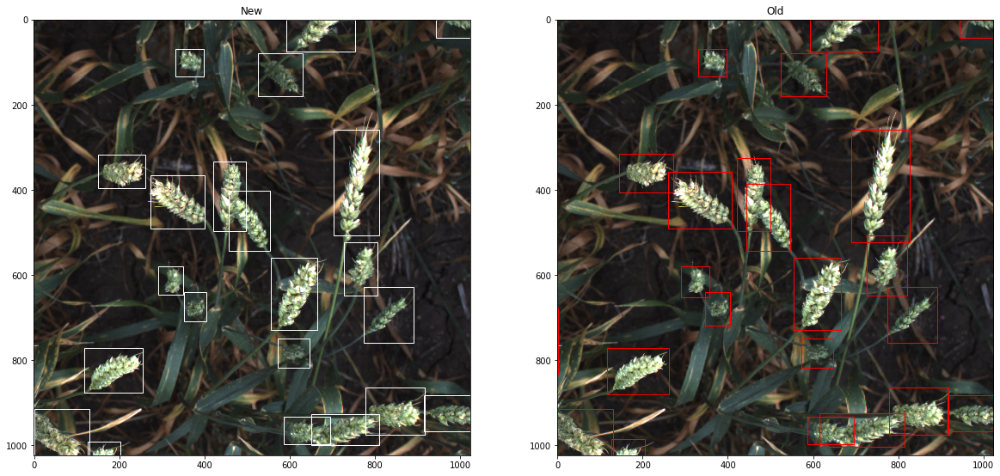

crop_1_crop_0_96-compressed.png
37 37


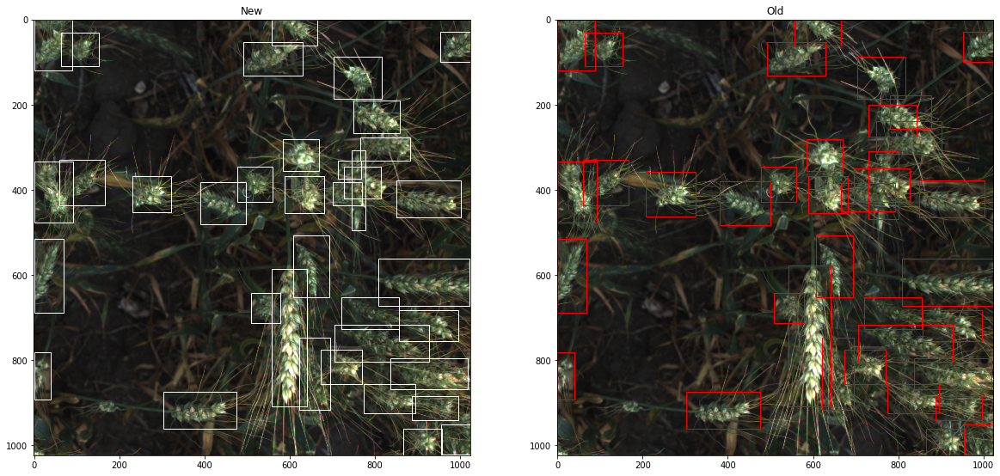

crop_1_crop_0_964-compressed.png
17 16


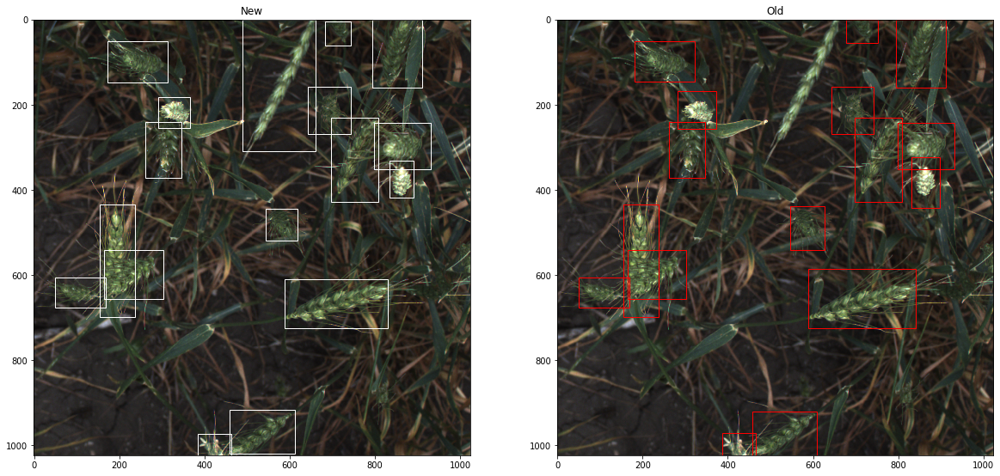

crop_1_crop_0_967-compressed.png
24 25


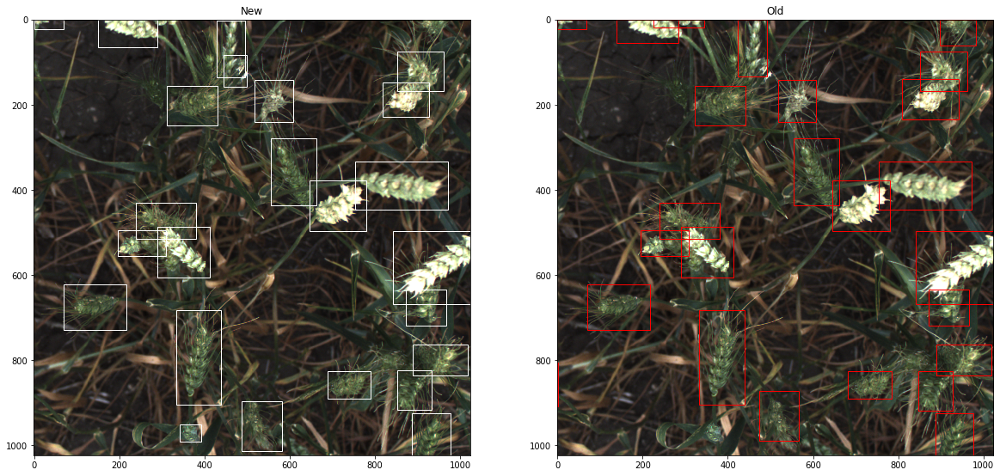

crop_1_crop_0_98-compressed.png
14 15


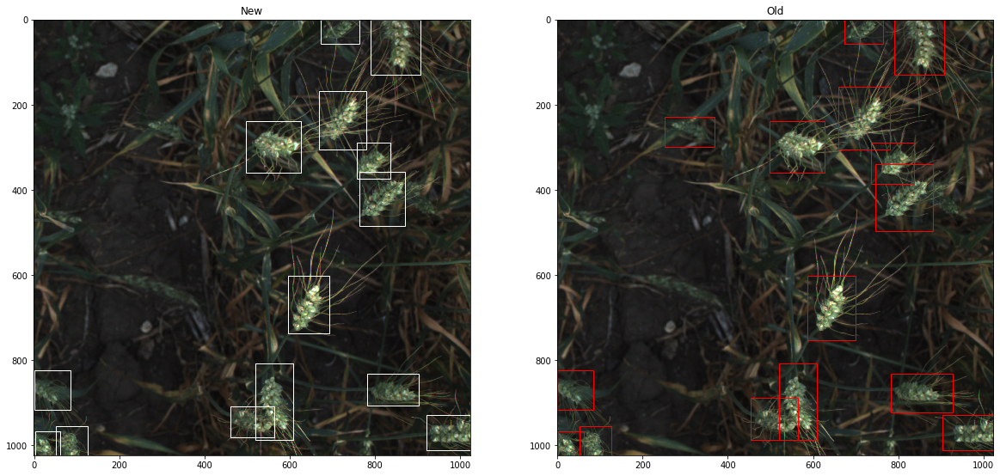

<IPython.core.display.Javascript object>

In [27]:
for image in test_images:
    boxes = dataset.get_bboxes_of_image(image, "XYP")
    boxes_old = test_dataset_old.get_bboxes_of_image(image, "XYP")

    print(image)
    print(len(boxes), len(boxes_old))

    utils.show_poly_anno(
        path_images + image, [boxes, boxes_old], ["New", "Old"], True, (20, 15)
    )